## Loading Libraries

In [1]:
import skfda
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

from skfda.exploratory.depth import ModifiedBandDepth, IntegratedDepth
from skfda.exploratory.visualization import Boxplot

from skfda.exploratory.visualization.clustering import (
    ClusterMembershipLinesPlot,
    ClusterMembershipPlot,
    ClusterPlot,
)
from skfda.ml.clustering import FuzzyCMeans, KMeans

from skfda.exploratory.visualization import FPCAPlot
from skfda.preprocessing.dim_reduction.feature_extraction import FPCA
from skfda.representation.basis import BSpline, Fourier, Monomial


## Loading data

In [ ]:
def wf(x):
    return '/Users/pruthvibharadwaj/Desktop/Spring 22/MA679 - ML/Project/Data/' + x

In [128]:
GRFx = pd.read_csv(wf('GRFx.csv'), header = None)
GRFy = pd.read_csv(wf('GRFy.csv'), header = None)
GRFz = pd.read_csv(wf('GRFz.csv'), header = None)

V_GRF_stance_N = pd.read_csv(wf('V_GRF_stance_N.csv'), header = None)
ML_GRF_stance_N = pd.read_csv(wf('ML_GRF_stance_N.csv'), header = None)
AP_GRF_stance_N = pd.read_csv(wf('AP_GRF_stance_N.csv'), header = None)

COPx = pd.read_csv(wf('COPx.csv'), header = None)
COPy = pd.read_csv(wf('COPy.csv'), header = None)

COPx_stance = pd.read_csv(wf('COPx_stance.csv'), header = None)
COPy_stance = pd.read_csv(wf('COPy_stance.csv'), header = None)

Mx = pd.read_csv(wf('Mx.csv'), header = None)
My = pd.read_csv(wf('My.csv'), header = None)
Mz = pd.read_csv(wf('Mz.csv'), header = None)

In [7]:
IDinfo = pd.read_csv(wf('IDinfo.csv'))
discrete = pd.read_csv(wf('discrete.csv'))

In [93]:
IDinfo

,ID,KNEE,TRIAL,tr_length
0,1,LEFT,2,938
1,1,LEFT,3,906
2,1,LEFT,4,907
3,1,LEFT,5,980
4,1,RIGHT,2,881
...,...,...,...,...
15691,1788,LEFT,4,612
15692,1788,LEFT,5,620
15693,1788,RIGHT,2,694
15694,1788,RIGHT,3,665


In [95]:
len(IDinfo['ID'].unique())

2291

In [98]:
IDinfo.groupby(by = ['KNEE'], dropna=False).count()['ID']

KNEE
LEFT     7862
RIGHT    7834
Name: ID, dtype: int64

In [105]:
IDinfo.groupby(by = ['KNEE'], dropna=False).nunique()['ID']

KNEE
LEFT     2275
RIGHT    2270
Name: ID, dtype: int64

In [108]:
IDinfo.groupby(by = ['KNEE'], dropna=False).mean()['TRIAL']

KNEE
LEFT     3.352709
RIGHT    3.340184
Name: TRIAL, dtype: float64

In [109]:
IDinfo.groupby(by = ['KNEE'], dropna=False).mean()['tr_length']

KNEE
LEFT     746.346222
RIGHT    754.895583
Name: tr_length, dtype: float64

In [104]:
max_trials = IDinfo.groupby(by = ['ID'], dropna=False).agg({'TRIAL':'max'}).reset_index()

max_trials.groupby(by = ['TRIAL'], dropna = False).agg({'ID':'count'})

,ID
TRIAL,
1,2
2,13
3,36
4,246
5,1979
6,12
7,3


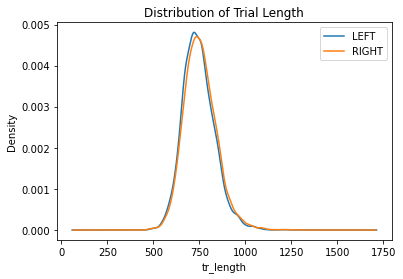

In [116]:
IDinfo.groupby("KNEE").tr_length.plot(kind='kde')
plt.xlabel("tr_length")
plt.title("Distribution of Trial Length")
plt.legend()

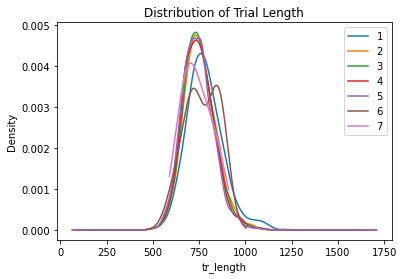

In [118]:
IDinfo.groupby("TRIAL").tr_length.plot(kind='kde')
plt.xlabel("tr_length")
plt.title("Distribution of Trial Length")
plt.legend()

No handles with labels found to put in legend.


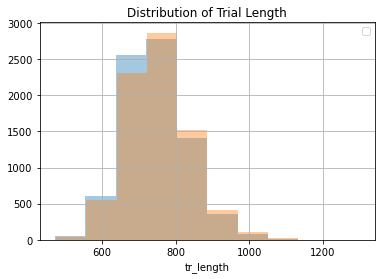

In [120]:
IDinfo.groupby("KNEE").tr_length.hist(alpha = 0.4)
plt.xlabel("tr_length")
plt.title("Distribution of Trial Length")
plt.legend()

No handles with labels found to put in legend.


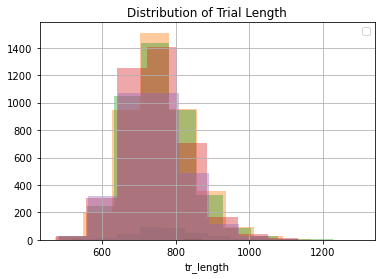

In [121]:
IDinfo.groupby("TRIAL").tr_length.hist(alpha = 0.4)
plt.xlabel("tr_length")
plt.title("Distribution of Trial Length")
plt.legend()

## Plotting Timeseries data

In [22]:
#Defining a list of grid points
grid_points_100 = list(range(1,101))
grid_points_2990 = list(range(1,2991))

### V_GRF_stance_N

In [26]:
#Creating an skfda object aav a 
V_GRF_stance_N_matrix = V_GRF_stance_N.to_numpy()

V_GRF_stance_N_fd = skfda.FDataGrid(
    data_matrix=V_GRF_stance_N_matrix,
    grid_points=grid_points_100,
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/279785841.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'V_GRF_stance')

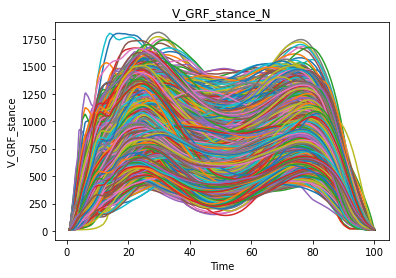

In [29]:
fig = V_GRF_stance_N_fd.plot()
fig.show()
plt.title("V_GRF_stance_N")
plt.xlabel("Time")
plt.ylabel("V_GRF_stance")

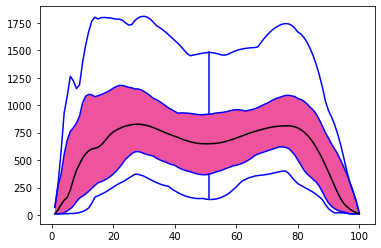

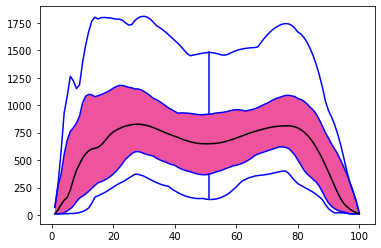

In [82]:
#Functional Boxplot

V_GRF_stance_N_fdBoxplot = Boxplot(V_GRF_stance_N_fd)
V_GRF_stance_N_fdBoxplot.show_full_outliers = True
V_GRF_stance_N_fdBoxplot.plot()

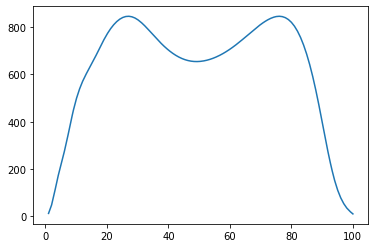

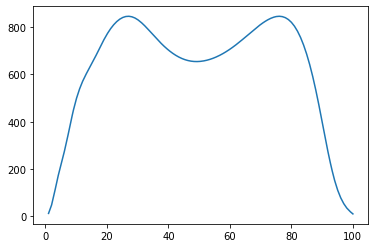

In [143]:

V_GRF_stance_N_mean = skfda.exploratory.stats.mean(V_GRF_stance_N_fd)
V_GRF_stance_N_mean.plot()

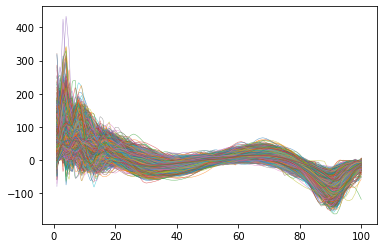

In [127]:
#Calculating derivates and plotting
V_GRF_stance_N_d = V_GRF_stance_N_fd.derivative()
fig = V_GRF_stance_N_d.plot(
    linewidth=0.5,
    alpha=0.7,
    legend=True,
)

Text(0.5, 1.0, 'FPCA with a 5 component BSpline basis for VGRF_Stance_N')

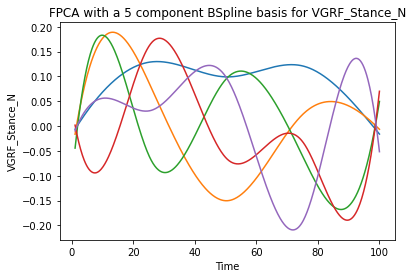

In [158]:
#Basis representation
basis = skfda.representation.basis.BSpline(n_basis=7)
V_GRF_stance_N_basis_fd = V_GRF_stance_N_fd.to_basis(basis)

V_GRF_stance_N_fpca_bs = FPCA(n_components=5)
V_GRF_stance_N_fpca_bs.fit(V_GRF_stance_N_basis_fd)
V_GRF_stance_N_fpca_bs.components_.plot()
plt.xlabel('Time')
plt.ylabel('VGRF_Stance_N')
plt.title('FPCA with a 5 component BSpline basis for VGRF_Stance_N')

In [159]:
V_GRF_stance_N_fpca_bs.explained_variance_ratio_

array([0.80431283, 0.12857167, 0.03443897, 0.01694093, 0.01260921])

Text(0.5, 1.0, 'FPCA with a 5 component Fourier basis for VGRF_Stance_N')

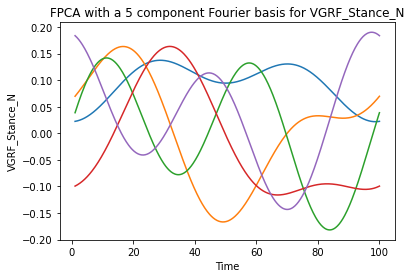

In [156]:
#Basis representation
basis = skfda.representation.basis.BSpline(n_basis=7)
V_GRF_stance_N_basis_fd = V_GRF_stance_N_fd.to_basis(basis)

V_GRF_stance_N_fpca_f = FPCA(n_components=5, components_basis=Fourier(n_basis=5))
V_GRF_stance_N_fpca_f.fit(V_GRF_stance_N_basis_fd)
V_GRF_stance_N_fpca_f.components_.plot()
plt.xlabel('Time')
plt.ylabel('VGRF_Stance_N')
plt.title('FPCA with a 5 component Fourier basis for VGRF_Stance_N')



In [157]:
V_GRF_stance_N_fpca_f.explained_variance_ratio_

array([0.81682148, 0.12552258, 0.03201398, 0.01512722, 0.01051474])

### ML_GRF_stance_N

In [30]:
#Creating an skfda object aav a 
ML_GRF_stance_N_matrix = ML_GRF_stance_N.to_numpy()

ML_GRF_stance_N_fd = skfda.FDataGrid(
    data_matrix=ML_GRF_stance_N_matrix,
    grid_points=grid_points_100,
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/262132128.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'ML_GRF_stance')

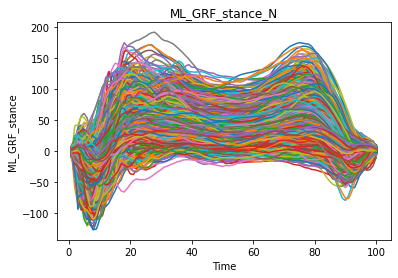

In [31]:
fig = ML_GRF_stance_N_fd.plot()
fig.show()
plt.title("ML_GRF_stance_N")
plt.xlabel("Time")
plt.ylabel("ML_GRF_stance")

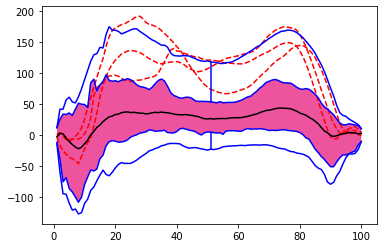

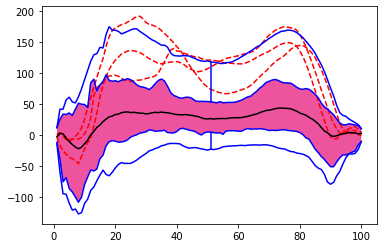

In [88]:
#Functional Boxplot

ML_GRF_stance_N_fdBoxplot = Boxplot(ML_GRF_stance_N_fd)
ML_GRF_stance_N_fdBoxplot.show_full_outliers = True
ML_GRF_stance_N_fdBoxplot.plot()

### AP_GRF_stance_N

In [32]:
#Creating an skfda object aav a 
AP_GRF_stance_N_matrix = AP_GRF_stance_N.to_numpy()

AP_GRF_stance_N_fd = skfda.FDataGrid(
    data_matrix=AP_GRF_stance_N_matrix,
    grid_points=grid_points_100,
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/1393233842.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'AP_GRF_stance')

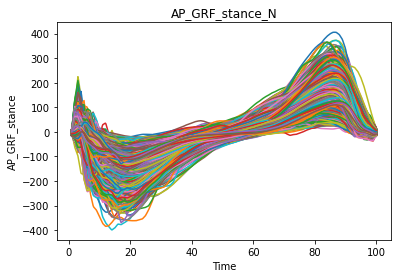

In [33]:

fig = AP_GRF_stance_N_fd.plot()
fig.show()
plt.title("AP_GRF_stance_N")
plt.xlabel("Time")
plt.ylabel("AP_GRF_stance")

### GRFx

In [43]:
#Creating an skfda object aav a 
GRFx_matrix = GRFx.to_numpy()

GRFx_fd = skfda.FDataGrid(
    data_matrix=GRFx_matrix,
    grid_points=grid_points_2990,
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/1322806588.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'GRFx')

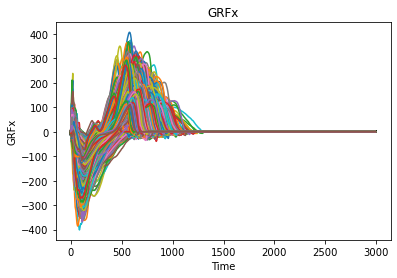

In [44]:

fig = GRFx_fd.plot()
fig.show()
plt.title("GRFx")
plt.xlabel("Time")
plt.ylabel("GRFx")

### GRFy

In [45]:
#Creating an skfda object aav a 
GRFy_matrix = GRFy.to_numpy()

GRFy_fd = skfda.FDataGrid(
    data_matrix=GRFy_matrix,
    grid_points=grid_points_2990,
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/3865809003.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'GRFy')

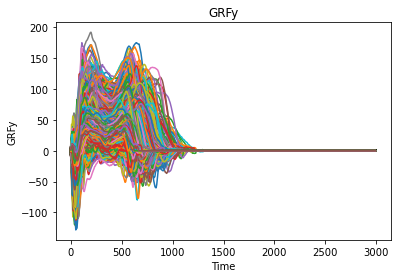

In [46]:
fig = GRFy_fd.plot()
fig.show()
plt.title("GRFy")
plt.xlabel("Time")
plt.ylabel("GRFy")

### GRFz

In [47]:
#Creating an skfda object aav a 
GRFz_matrix = GRFz.to_numpy()

GRFz_fd = skfda.FDataGrid(
    data_matrix=GRFz_matrix,
    grid_points=grid_points_2990
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/11326905.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'GRFz')

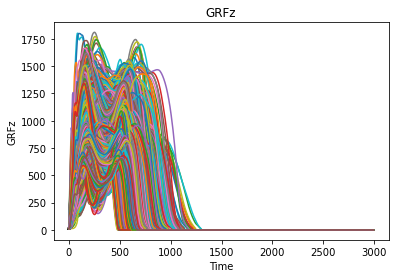

In [48]:
fig = GRFz_fd.plot()
fig.show()
plt.title("GRFz")
plt.xlabel("Time")
plt.ylabel("GRFz")

### COPx_stance

In [50]:
#Creating an skfda object aav a 
COPx_stance_matrix = COPx_stance.to_numpy()

COPx_stance_fd = skfda.FDataGrid(
    data_matrix=COPx_stance_matrix,
    grid_points=grid_points_100
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/1623978155.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'COPx_stance')

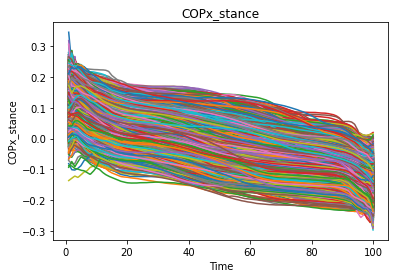

In [51]:
fig = COPx_stance_fd.plot()
fig.show()
plt.title("COPx_stance")
plt.xlabel("Time")
plt.ylabel("COPx_stance")

### COPy_stance

In [52]:
#Creating an skfda object aav a 
COPy_stance_matrix = COPy_stance.to_numpy()

COPy_stance_fd = skfda.FDataGrid(
    data_matrix=COPy_stance_matrix,
    grid_points=grid_points_100
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/3087371818.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'COPy_stance')

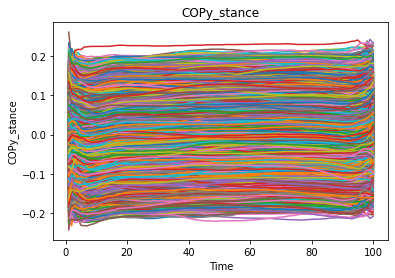

In [53]:
fig = COPy_stance_fd.plot()
fig.show()
plt.title("COPy_stance")
plt.xlabel("Time")
plt.ylabel("COPy_stance")

### COPx

In [56]:
#Creating an skfda object aav a 
COPx_matrix = COPx.to_numpy()

COPx_fd = skfda.FDataGrid(
    data_matrix=COPx_matrix,
    grid_points=grid_points_2990
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/2462955578.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'COPx')

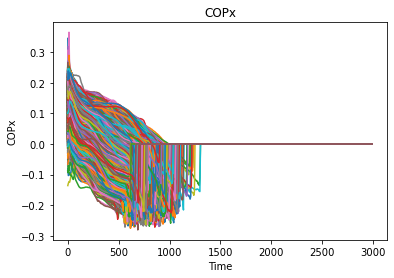

In [57]:
fig = COPx_fd.plot()
fig.show()
plt.title("COPx")
plt.xlabel("Time")
plt.ylabel("COPx")

### COPy

In [60]:
#Creating an skfda object aav a 
COPy_matrix = COPy.to_numpy()

COPy_fd = skfda.FDataGrid(
    data_matrix=COPy_matrix,
    grid_points=grid_points_2990
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/3740015551.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'COPy')

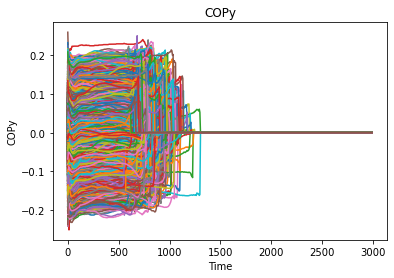

In [61]:
fig = COPy_fd.plot()
fig.show()
plt.title("COPy")
plt.xlabel("Time")
plt.ylabel("COPy")

### Mx

In [58]:
#Creating an skfda object aav a 
Mx_matrix = Mx.to_numpy()

Mx_fd = skfda.FDataGrid(
    data_matrix=Mx_matrix,
    grid_points=grid_points_2990
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/1293987654.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'Mx')

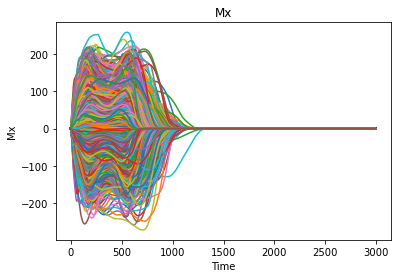

In [59]:
fig = Mx_fd.plot()
fig.show()
plt.title("Mx")
plt.xlabel("Time")
plt.ylabel("Mx")

### My

In [62]:
#Creating an skfda object aav a 
My_matrix = My.to_numpy()

My_fd = skfda.FDataGrid(
    data_matrix=My_matrix,
    grid_points=grid_points_2990
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/2694221823.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'My')

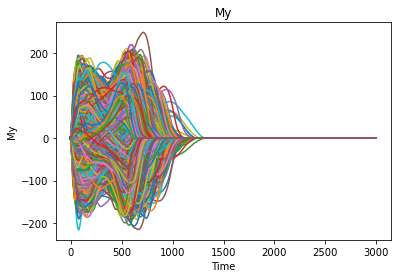

In [63]:
fig = My_fd.plot()
fig.show()
plt.title("My")
plt.xlabel("Time")
plt.ylabel("My")

### Mz

In [64]:
#Creating an skfda object aav a 
Mz_matrix = Mz.to_numpy()

Mz_fd = skfda.FDataGrid(
    data_matrix=Mz_matrix,
    grid_points=grid_points_2990
)

 /var/folders/2l/bfgdjf7s3_5dkyx0jgmgv1l80000gn/T/ipykernel_2929/3656505234.py:2: UserWarning:Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.


Text(0, 0.5, 'Mz')

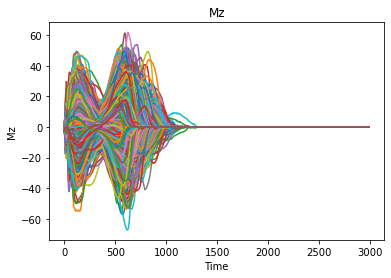

In [65]:
fig = Mz_fd.plot()
fig.show()
plt.title("Mz")
plt.xlabel("Time")
plt.ylabel("Mz")

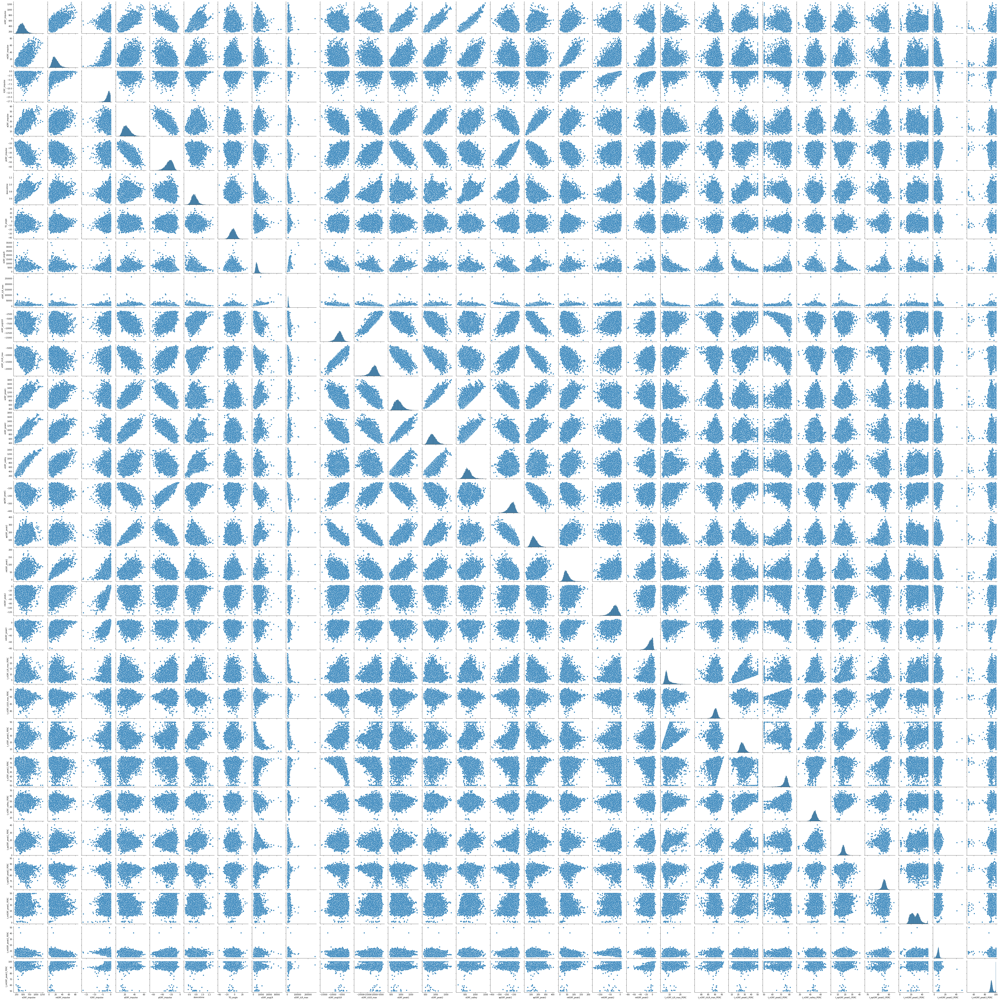

<Figure size 432x288 with 0 Axes>

In [141]:
sns.pairplot(discrete)
plt.show()
plt.savefig('/Users/pruthvibharadwaj/Desktop/Spring 22/MA679 - ML/Project/discrete_corr_matrix.png')

In [2]:
pip install fdasrsf

Note: you may need to restart the kernel to use updated packages.
